In [17]:
import pandas as pd
from csv import reader
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [18]:

with open("raw_data/ms_pacman/52_RZ_2394668_Aug-10-14-52-42.txt") as obj:
    csv_reader = reader(obj)
    header = next(csv_reader)
    for row in csv_reader:
        print(row)


['RZ_2394668_1', 'null', 'null', '1258', '0', '0', '79.89', '101.78', '79.88', '101.47', '79.86', '101.17', '79.86', '101.25', '79.86', '101.50', '79.86', '101.75', '79.88', '101.75', '79.90', '101.55', '79.92', '101.38', '79.88', '101.25', '79.83', '101.25', '79.83', '101.45', '79.89', '101.70', '79.95', '101.92', '79.89', '101.95', '79.83', '101.85', '79.75', '101.83', '79.75', '101.83', '79.75', '101.88', '79.74', '101.97', '79.74', '102.08', '79.75', '102.03', '79.83', '101.90', '79.89', '101.83', '79.96', '101.97', '79.99', '102.10', '79.97', '101.97', '79.95', '101.72', '79.92', '101.40', '79.86', '101.28', '79.81', '101.38', '79.79', '101.55', '79.81', '101.70', '79.85', '101.65', '79.79', '101.67', '79.74', '101.72', '79.67', '101.83', '79.67', '101.83', '79.67', '101.83', '79.66', '101.80', '79.74', '101.78', '79.81', '101.72', '79.89', '101.67', '79.88', '101.60', '79.84', '101.55', '79.83', '101.60', '79.83', '101.65', '79.86', '101.58', '79.90', '101.42', '79.90', '101.28',

In [4]:
frame_ids = []
episode_ids = []
scores = []
durations = []
unclipped_rewards = []
actions = []
gaze_positions_x = []
gaze_positions_y = []

with open("/Users/nicolebasinski/Desktop/atari-HEAD/raw_data/ms_pacman/52_RZ_2394668_Aug-10-14-52-42.txt") as obj:
    csv_reader = reader(obj)
    header = next(csv_reader)
    for row in csv_reader:
        start = 6
        end = len(row) - 1
        for i in range(start, end, 2):
            current_x = row[i]
            current_y = row[i+1]
            frame_ids.append(row[0])
            episode_ids.append(row[1])
            scores.append(row[2])
            durations.append(row[3])
            unclipped_rewards.append(row[4])
            actions.append(row[5])
            gaze_positions_x.append(current_x)
            gaze_positions_y.append(current_y)

In [5]:
df = pd.DataFrame({
    'frame_id': frame_ids,
    'episode_id':  episode_ids,
    'score': scores,
    'duration': durations,
    'unclipped_reward': unclipped_rewards,
    'action': actions,
    'gaze_position_x': gaze_positions_x,
    'gaze_position_y': gaze_positions_y,
})
df.shape

(885688, 8)

In [16]:
df.describe()

,frame_id,episode_id,score,duration,unclipped_reward,action,gaze_position_x,gaze_position_y
count,885688,885688,885688,885688,885688,885688,885688,885688
unique,17560,1,1,36,12,9,12952,10683
top,RZ_2394668_1,null,null,50,0,4,79.99,82.50
freq,1174,885688,885688,713367,853580,225166,254,390


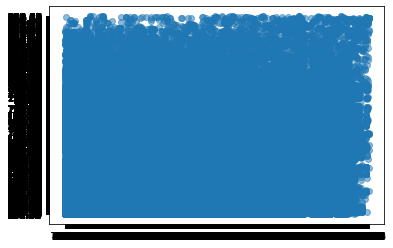

In [35]:
plt.scatter(df.gaze_position_x, df.gaze_position_y, cmap=df.action, alpha=0.5)

<AxesSubplot:xlabel='gaze_position_x', ylabel='gaze_position_y'>

/Users/nicolebasinski/.pyenv/versions/3.8.13/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/nicolebasinski/.pyenv/versions/3.8.13/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/nicolebasinski/.pyenv/versions/3.8.13/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/nicolebasinski/.pyenv/versions/3.8.13/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/nicolebasinski/.pyenv/versions/3.8.13/lib/python3.8/site-packages

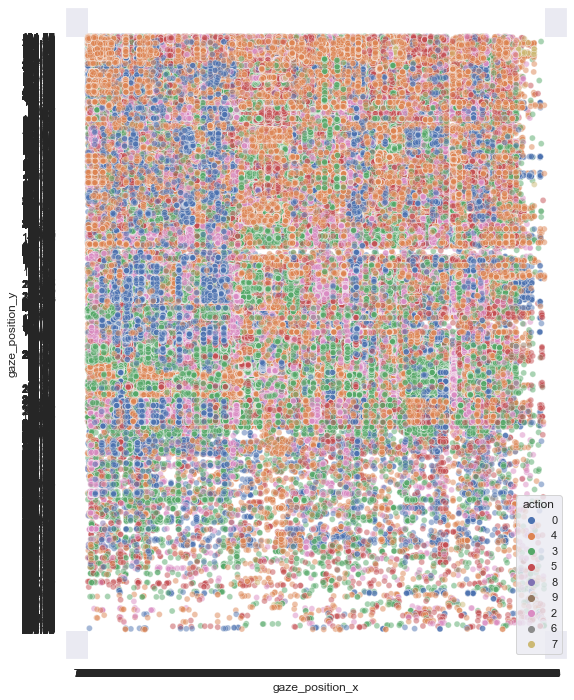

In [44]:
sns.set(rc={'figure.figsize':(9,12)})
sns.scatterplot(x=df.gaze_position_x, y=df.gaze_position_y, hue=df.action, alpha=0.5)